In [123]:
! pip install bertopic

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [152]:
! pip install wordcloud

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 460.4/460.4 kB 4.2 MB/s eta 0:00:000:00:010:00:01


In [32]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
import pandas as pd
import nltk
import re
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.representation import KeyBERTInspired
from bertopic.representation import PartOfSpeech
from bertopic.representation import MaximalMarginalRelevance
from spacy.lang.en import English
import spacy

In [33]:
df = pd.read_csv('New_Delhi_reviews.csv')

In [34]:
df.dropna(inplace = True)

In [35]:
documents = df['review_full']
documents[0:10]

0    Totally in love with the Auro of the place, re...
1    I went this bar 8 days regularly with my husba...
2    We were few friends and was a birthday celebra...
3    Fatjar Cafe and Market is the perfect place fo...
4    Hey Guys, if you are craving for pizza and sea...
5    We were looking for a special meal and we foun...
6    Kailash colony is brimming with small cafes no...
7    If you are looking for a varied selection of d...
8    Kailash Colony is the place I always head to w...
9    Real nice and comfortable bar. I am a whiskey ...
Name: review_full, dtype: object

# Performing basic cleaning

In [36]:
stopwords = nltk.corpus.stopwords.words('english')
punctuation = r'[/.!$%^&#*+\'\"()-.,:;<=>?@[\]{}|]'

In [37]:
def clean_text(text):
    """
    Clean text
    :parameters:
        text: sentence (string)
    :return: preprocessed documents without punctuations and stopwords, and lowercased
    """
    pp_text = re.sub(punctuation, ' ', text)
    pp_text = pp_text.lower()
    pp_text = ' '.join([w for w in pp_text.split() if len(w) > 1 and w not in stopwords])
    return pp_text

In [38]:
df['pp_text'] = df['review_full'].apply(clean_text)

In [39]:
# vectorizer = CountVectorizer(stop_words=None,
#                              tokenizer=None,
#                              min_df=1,
#                              max_df=0.75,
#                              ngram_range=(1, 2),
#                              lowercase=True,
#                             token_pattern=r'\b[a-zA-Z]{2,}\b')

vectorizer = CountVectorizer(stop_words=None,
                             tokenizer=None,
                             min_df=1,
                             max_df=0.75,
                             ngram_range=(1, 2),
                             lowercase=True)

vectorizer.fit_transform(df['pp_text'])
vocabulary = set(vectorizer.get_feature_names())

def countvectorized_clean(text):
    return ' '.join([w for w in text.split() if w.lower() in vocabulary])

df['pp_text'] = df['pp_text'].apply(countvectorized_clean)

In [40]:
df.head()

,rating_review,review_full,pp_text
0,5,"Totally in love with the Auro of the place, re...",totally love auro place really beautiful quite...
1,5,I went this bar 8 days regularly with my husba...,went bar days regularly husband fully satisfie...
2,5,We were few friends and was a birthday celebra...,friends birthday celebration food good taste r...
3,5,Fatjar Cafe and Market is the perfect place fo...,fatjar cafe market perfect place casual lunch ...
4,5,"Hey Guys, if you are craving for pizza and sea...",hey guys craving pizza searching visit cafe ye...


# Running topic modeling for reviews with specific ratings (rating = 5)

In [220]:
rating = 5

In [221]:
df_rating = df[df['rating_review'] == rating]
df_rating.shape

(72389, 3)

In [222]:
# # skipping basic cleaning
# df_rating['pp_text'] = df_rating['review_full']
documents = df_rating['pp_text'].to_list()

In [223]:
print(len(documents))

72389


In [224]:
# The main representation of a topic
main_representation = KeyBERTInspired()

# Additional ways of representing a topic
aspect_model1 = [KeyBERTInspired(top_n_words=30), MaximalMarginalRelevance(diversity=.5)]

# Add all models together to be run in a single `fit`
representation_model = {
   "Main": main_representation,
   "Aspect1":  aspect_model1
}

In [225]:
# Initializing BERTopic model
model = BERTopic(language = 'multilingual',
                 top_n_words = 10,
                 calculate_probabilities = True,
                 n_gram_range = (1, 2),
                 verbose = True,
                 representation_model=representation_model)

In [226]:
# fit model to documents
topics, probabilities = model.fit_transform(documents=documents)

Batches:   0%|          | 0/2263 [00:00<?, ?it/s]

2023-06-14 10:43:18,980 - BERTopic - Transformed documents to Embeddings
2023-06-14 10:43:47,919 - BERTopic - Reduced dimensionality


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

2023-06-14 10:45:45,205 - BERTopic - Clustered reduced embeddings


In [227]:
model.get_topic_info()

,Topic,Count,Name,Representation,Aspect1,Representative_Docs
0,-1,39330,-1_restaurants_restaurant_cuisine_dining,"[restaurants, restaurant, cuisine, dining, buf...","[restaurants, dining, buffet, menu, tasty, chi...",[restaurant needs introduction actually review...
1,0,2390,0_music food_food music_nice music_great music,"[music food, food music, nice music, great mus...","[food music, good music, rock cafe, loud music...",[place amazing particularly live music weekend...
2,1,1809,1_indian cuisine_meal india_indian restaurant_...,"[indian cuisine, meal india, indian restaurant...","[indian cuisine, meal india, indian restaurant...",[one best north indian food good food quality ...
3,2,1733,2_butter chicken_chicken butter_chicken good_b...,"[butter chicken, chicken butter, chicken good,...","[butter chicken, chicken good, chicken chicken...",[wait well worth finger licking tandoori chick...
4,3,1674,3_bar great_best bar_bartenders_grappa bar,"[bar great, best bar, bartenders, grappa bar, ...","[best bar, bartenders, grappa bar, cocktails, ...",[great service quoin bar aerocity good ambienc...
...,...,...,...,...,...,...
257,256,10,256_food hospitality_great customers_hospitali...,"[food hospitality, great customers, hospitalit...","[great customers, hospitality amit, drinks cou...",[visited last night enjoyed food hospitality s...
258,257,10,257_naivedyam restaurant_restaurant sri_dishes...,"[naivedyam restaurant, restaurant sri, dishes ...","[naivedyam restaurant, dishes dakshin, eaten n...",[though live chennai starved eating spicy myso...
259,258,10,258_chinese cuisines_chinese cuisine_chinese f...,"[chinese cuisines, chinese cuisine, chinese fo...","[chinese cuisines, taste chinese, cuisines bev...",[recently dined royal china nehru place offers...
260,259,10,259_heerlijk eten_bestest hospitality_hospital...,"[heerlijk eten, bestest hospitality, hospitali...","[bestest hospitality, oberoi hospitality, rest...",[amazing food bestest hospitality world ashok ...


In [243]:
model.get_document_info(documents)

,Document,Topic,Name,Representation,Aspect1,Representative_Docs,Top_n_words,Probability,Representative_document
0,totally love auro place really beautiful quite...,11,11_cafe_place_seating_menu,"[cafe, place, seating, menu, taste, tasted, dr...","[cafe, seating, menu, taste, drinks, delicious...",[satya niketan place want overload stomach aff...,cafe - place - seating - menu - taste - tasted...,0.056673,False
1,went bar days regularly husband fully satisfie...,8,8_excellent service_great service_good service...,"[excellent service, great service, good servic...","[good service, hospitality, service mr, courte...",[thanks lot awesome hospitality really appreci...,excellent service - great service - good servi...,0.135370,False
2,friends birthday celebration food good taste r...,10,10_birthday celebration_birthday party_birthda...,"[birthday celebration, birthday party, birthda...","[birthday celebration, birthday food, celebrat...",[several time never fails deliver great place ...,birthday celebration - birthday party - birthd...,0.184362,False
3,fatjar cafe market perfect place casual lunch ...,-1,-1_restaurants_restaurant_cuisine_dining,"[restaurants, restaurant, cuisine, dining, buf...","[restaurants, dining, buffet, menu, tasty, chi...",[restaurant needs introduction actually review...,restaurants - restaurant - cuisine - dining - ...,0.668461,False
4,hey guys craving pizza searching visit cafe ye...,-1,-1_restaurants_restaurant_cuisine_dining,"[restaurants, restaurant, cuisine, dining, buf...","[restaurants, dining, buffet, menu, tasty, chi...",[restaurant needs introduction actually review...,restaurants - restaurant - cuisine - dining - ...,0.569930,False
...,...,...,...,...,...,...,...,...,...
72384,excellent food variety breakfast good services...,4,4_breakfast buffet_buffet breakfast_excellent ...,"[breakfast buffet, buffet breakfast, excellent...","[breakfast buffet, breakfast good, service bre...",[breakfast excellent thanks joshika zaizai son...,breakfast buffet - buffet breakfast - excellen...,0.082291,False
72385,near airport calm cool environment nice staff ...,-1,-1_restaurants_restaurant_cuisine_dining,"[restaurants, restaurant, cuisine, dining, buf...","[restaurants, dining, buffet, menu, tasty, chi...",[restaurant needs introduction actually review...,restaurants - restaurant - cuisine - dining - ...,0.019277,False
72386,favourite place stay great service ashish bhar...,-1,-1_restaurants_restaurant_cuisine_dining,"[restaurants, restaurant, cuisine, dining, buf...","[restaurants, dining, buffet, menu, tasty, chi...",[restaurant needs introduction actually review...,restaurants - restaurant - cuisine - dining - ...,0.418897,False
72387,good food nice decoration drinks list alot cho...,-1,-1_restaurants_restaurant_cuisine_dining,"[restaurants, restaurant, cuisine, dining, buf...","[restaurants, dining, buffet, menu, tasty, chi...",[restaurant needs introduction actually review...,restaurants - restaurant - cuisine - dining - ...,0.814896,False


In [228]:
model.visualize_topics()

In [229]:
model.visualize_term_rank()

In [230]:
model.visualize_heatmap()

In [11]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordcloud(topic_model, topic):
    text = {word: value for word, value in topic_model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

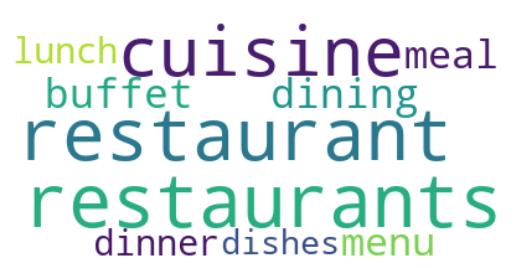

In [254]:
# Show word cloud
create_wordcloud(model, topic=-1)

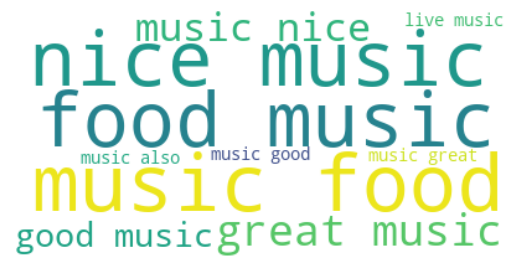

In [232]:
# Show word cloud
create_wordcloud(model, topic=0)

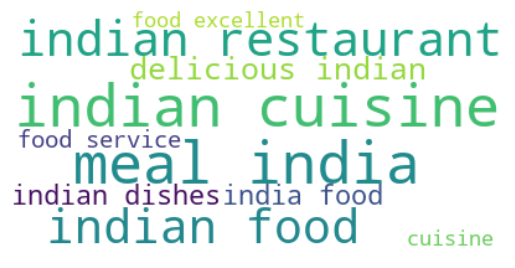

In [233]:
# Show word cloud
create_wordcloud(model, topic=1)

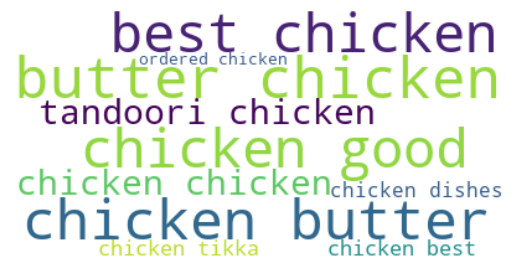

In [234]:
# Show word cloud
create_wordcloud(model, topic=2)

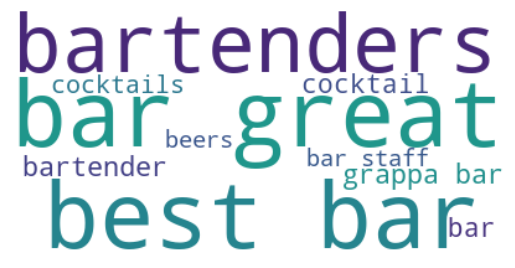

In [235]:
# Show word cloud
create_wordcloud(model, topic=3)

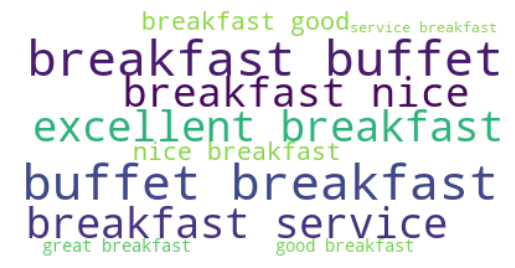

In [236]:
# Show word cloud
create_wordcloud(model, topic=4)

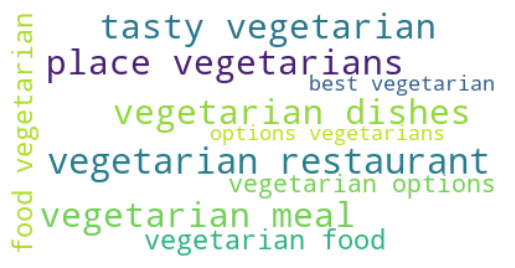

In [237]:
# Show word cloud
create_wordcloud(model, topic=5)

# Running topic modeling for reviews with specific ratings (rating = 1)

In [256]:
rating = 1
df_rating = df[df['rating_review'] == rating]
documents = df_rating['pp_text'].to_list()
df_rating.shape

(4455, 3)

In [257]:
# The main representation of a topic
main_representation = KeyBERTInspired()

# Additional ways of representing a topic
aspect_model1 = [KeyBERTInspired(top_n_words=30), MaximalMarginalRelevance(diversity=.5)]

# Add all models together to be run in a single `fit`
representation_model = {
   "Main": main_representation,
   "Aspect1":  aspect_model1
}

# Initializing BERTopic model
model = BERTopic(language = 'multilingual',
                 top_n_words = 10,
                 calculate_probabilities = True,
                 n_gram_range = (1, 2),
                 verbose = True,
                 representation_model=representation_model)
                 
# fit model to documents
topics, probabilities = model.fit_transform(documents=documents)

Batches:   0%|          | 0/140 [00:00<?, ?it/s]

2023-06-14 12:43:35,553 - BERTopic - Transformed documents to Embeddings
2023-06-14 12:43:38,853 - BERTopic - Reduced dimensionality
2023-06-14 12:43:39,182 - BERTopic - Clustered reduced embeddings


In [258]:
model.get_topic_info()

,Topic,Count,Name,Representation,Aspect1,Representative_Docs
0,-1,2678,-1_restaurant_customers_waiters_waiter,"[restaurant, customers, waiters, waiter, lunch...","[restaurant, customers, waiters, lunch, taste,...",[went masaba 25th march sat night 4th time pla...
1,0,190,0_staff behaviour_rude staff_staff rude_staff bad,"[staff behaviour, rude staff, staff rude, staf...","[staff behaviour, rude staff, staff bad, pathe...",[impolite worst ever treatment towards custome...
2,1,87,1_food chinese_chinese food_chinese cuisine_ch...,"[food chinese, chinese food, chinese cuisine, ...","[chinese cuisine, good chinese, sushi, food qu...",[wife likes chinese food berco one better opti...
3,2,87,2_tandoori chicken_ordered chicken_chicken tik...,"[tandoori chicken, ordered chicken, chicken ti...","[tandoori chicken, ordered chicken, chicken cu...",[ordered half chicken mughlai half chicken jah...
4,3,85,3_buffet_dishes_soups_restaurant,"[buffet, dishes, soups, restaurant, cooked, di...","[buffet, dishes, soups, chicken, salads, noodl...",[ussually never write long reviews kind low qu...
5,4,75,4_indian food_assamese cuisine_cuisine_meals,"[indian food, assamese cuisine, cuisine, meals...","[indian food, assamese cuisine, rice served, l...",[assamese definitely tasted authentic assamese...
6,5,70,5_music bad_music loud_loud music_club,"[music bad, music loud, loud music, club, musi...","[music bad, loud music, club, asked dj, good m...",[multiple times since one hottest night clubs ...
7,6,69,6_terrible food_food terrible_tastes sour_food...,"[terrible food, food terrible, tastes sour, fo...","[tastes sour, worst food, expensive food, food...",[avoid sickening place save stomach highly pri...
8,7,64,7_restaurant_cafe_waiter_bar,"[restaurant, cafe, waiter, bar, dinner, 10 min...","[restaurant, waiter, bar, 10 minutes, drinks, ...",[dine restaurant every visit india great locat...
9,8,62,8_ordered pizza_dominos pizza_good pizza_pizza,"[ordered pizza, dominos pizza, good pizza, piz...","[ordered pizza, dominos pizza, pizza hut, chic...",[ordered online pizza prem nagar outlet applie...


In [259]:
model.get_document_info(documents)

,Document,Topic,Name,Representation,Aspect1,Representative_Docs,Top_n_words,Probability,Representative_document
0,service ok food seemed good except wife ate sc...,27,27_food poisoning_food poisoned_worst food_bad...,"[food poisoning, food poisoned, worst food, ba...","[food poisoned, bad food, eating food, sunday ...",[went sunday brunch rs 999 liquor food ambienc...,food poisoning - food poisoned - worst food - ...,1.000000,False
1,worst experience bar far cocktails almost alco...,-1,-1_restaurant_customers_waiters_waiter,"[restaurant, customers, waiters, waiter, lunch...","[restaurant, customers, waiters, lunch, taste,...",[went masaba 25th march sat night 4th time pla...,restaurant - customers - waiters - waiter - lu...,0.028497,False
2,good food chinese group like restaurant serve ...,1,1_food chinese_chinese food_chinese cuisine_ch...,"[food chinese, chinese food, chinese cuisine, ...","[chinese cuisine, good chinese, sushi, food qu...",[wife likes chinese food berco one better opti...,food chinese - chinese food - chinese cuisine ...,0.463467,False
3,went kylin celebrate mom dad anniversary today...,42,42_anniversary dinner_restaurant_back restaura...,"[anniversary dinner, restaurant, back restaura...","[anniversary dinner, back restaurant, tom yum,...",[going positive reviews selected place husband...,anniversary dinner - restaurant - back restaur...,0.356615,False
4,food coast cafe last night horrible seems guja...,-1,-1_restaurant_customers_waiters_waiter,"[restaurant, customers, waiters, waiter, lunch...","[restaurant, customers, waiters, lunch, taste,...",[went masaba 25th march sat night 4th time pla...,restaurant - customers - waiters - waiter - lu...,0.794133,False
...,...,...,...,...,...,...,...,...,...
4450,annamaya disappointment food average portion s...,-1,-1_restaurant_customers_waiters_waiter,"[restaurant, customers, waiters, waiter, lunch...","[restaurant, customers, waiters, lunch, taste,...",[went masaba 25th march sat night 4th time pla...,restaurant - customers - waiters - waiter - lu...,0.928685,False
4451,made reservations party 14 celebrate two birth...,30,30_birthday party_restaurant_guests_birthday c...,"[birthday party, restaurant, guests, birthday ...","[birthday party, catering, guest, cake, appeti...",[40 minutes incessant follow restaurant staff ...,birthday party - restaurant - guests - birthda...,0.216271,False
4452,booking dine went restaurant whole family arou...,17,17_restaurant_waiters_waiter informed_waiter,"[restaurant, waiters, waiter informed, waiter,...","[waiters, leave restaurant, wait table, dishes...",[visited restaurant today breakfast today tabl...,restaurant - waiters - waiter informed - waite...,0.254448,False
4453,food served late cold enough varieties worth m...,6,6_terrible food_food terrible_tastes sour_food...,"[terrible food, food terrible, tastes sour, fo...","[tastes sour, worst food, expensive food, food...",[avoid sickening place save stomach highly pri...,terrible food - food terrible - tastes sour - ...,0.185874,False


In [260]:
model.visualize_topics()

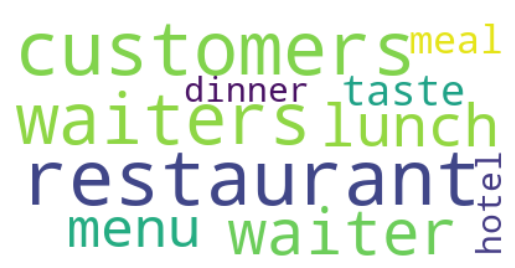

In [261]:
# Show word cloud
create_wordcloud(model, topic=-1)

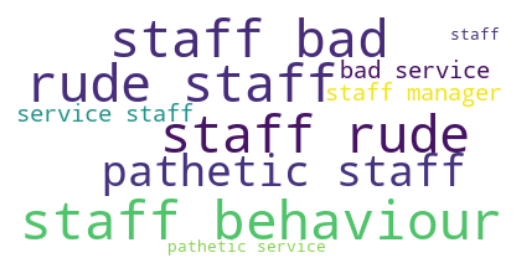

In [262]:
# Show word cloud
create_wordcloud(model, topic=0)

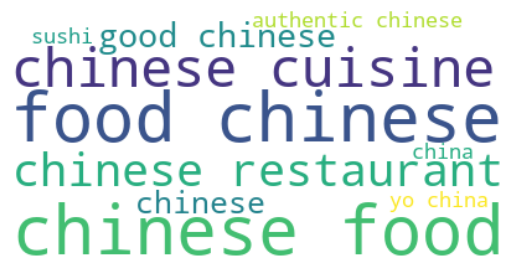

In [263]:
# Show word cloud
create_wordcloud(model, topic=1)

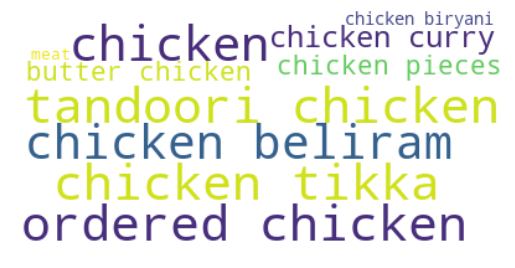

In [264]:
# Show word cloud
create_wordcloud(model, topic=2)

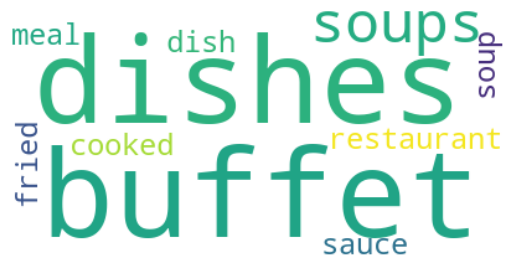

In [265]:
# Show word cloud
create_wordcloud(model, topic=3)

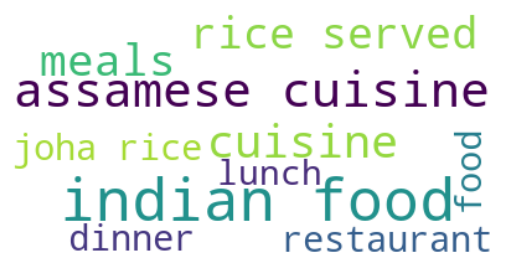

In [266]:
# Show word cloud
create_wordcloud(model, topic=4)

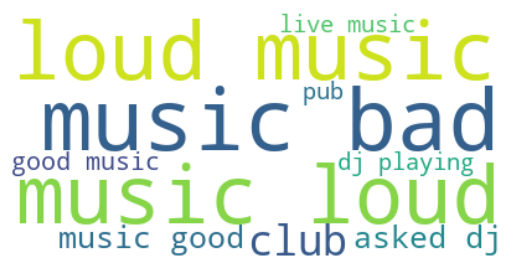

In [267]:
# Show word cloud
create_wordcloud(model, topic=5)

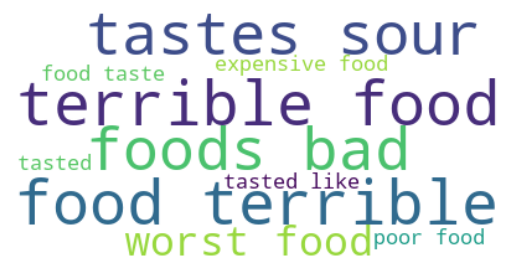

In [268]:
# Show word cloud
create_wordcloud(model, topic=6)

# Running topic modeling for reviews (all ratings)

In [41]:
documents = df['pp_text'].to_list()
df.shape

(147579, 3)

In [42]:
# The main representation of a topic
main_representation = KeyBERTInspired()

# Additional ways of representing a topic
aspect_model1 = [KeyBERTInspired(top_n_words=30), MaximalMarginalRelevance(diversity=.5)]

# Add all models together to be run in a single `fit`
representation_model = {
   "Main": main_representation,
   "Aspect1":  aspect_model1
}

# Initializing BERTopic model
model = BERTopic(language = 'multilingual',
                 top_n_words = 10,
                 calculate_probabilities = True,
                 n_gram_range = (1, 2),
                 verbose = True,
                 representation_model=representation_model)
                 
# fit model to documents
topics, probabilities = model.fit_transform(documents=documents)

Batches:   0%|          | 0/4612 [00:00<?, ?it/s]

2023-06-16 10:09:19,790 - BERTopic - Transformed documents to Embeddings
2023-06-16 10:10:09,746 - BERTopic - Reduced dimensionality


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

2023-06-16 10:22:02,124 - BERTopic - Clustered reduced embeddings


In [43]:
# saving bertopic model
model.save("bertopic_model")

/home/dvianna/anaconda3/lib/python3.9/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.



In [45]:
model.get_topic_info()

,Topic,Count,Name,Representation,Aspect1,Representative_Docs
0,-1,80199,-1_restaurants_restaurant_buffet_meal,"[restaurants, restaurant, buffet, meal, lunch,...","[restaurants, buffet, delhi, dinner, chicken, ...",[worst indian restaurant goes dhaba one worst ...
1,0,4942,0_pizza hut_good pizza_pizza good_pizzas,"[pizza hut, good pizza, pizza good, pizzas, pi...","[pizza hut, pizza good, pizza pasta, italian r...",[nice fine dining italian restaurant love pizz...
2,1,3854,1_butter chicken_chicken butter_chicken dishes...,"[butter chicken, chicken butter, chicken dishe...","[butter chicken, chicken dishes, chicken good,...",[even like butter chicken much must go eat but...
3,2,3685,2_indian cuisine_indian restaurant_meal india_...,"[indian cuisine, indian restaurant, meal india...","[indian cuisine, indian restaurant, meal india...",[restaurant indeed serves authentic north indi...
4,3,3114,3_music food_good music_food music_music nice,"[music food, good music, food music, music nic...","[food music, music good, great food, good plac...",[awesome place loved ambience music food coz p...
...,...,...,...,...,...,...
347,346,10,346_places didnt_dinner thinks_gather places_a...,"[places didnt, dinner thinks, gather places, a...","[places didnt, dinner thinks, anyways happier,...",[bar part park hotel wife guests hotel went su...
348,347,10,347_food bukara_baja yummy_rosdt masala_mumbai...,"[food bukara, baja yummy, rosdt masala, mumbai...","[food bukara, mumbai raw, love sarvana, signif...",[love sarvana sambar served sarvana best eaten...
349,348,10,348_restaurant ya_flavours halls_food great_lo...,"[restaurant ya, flavours halls, food great, lo...","[restaurant ya, flavours halls, hot deliciousl...",[must place friendly ambience yummy food place...
350,349,10,349_mughlai cuisine_mughlai food_cuisine among...,"[mughlai cuisine, mughlai food, cuisine among,...","[mughlai cuisine, cuisine heart, meal cannot, ...",[must visiting delhi authentic mughlai cuisine...


In [46]:
model.get_document_info(documents)

,Document,Topic,Name,Representation,Aspect1,Representative_Docs,Top_n_words,Probability,Representative_document
0,totally love auro place really beautiful quite...,-1,-1_restaurants_restaurant_buffet_meal,"[restaurants, restaurant, buffet, meal, lunch,...","[restaurants, buffet, delhi, dinner, chicken, ...",[worst indian restaurant goes dhaba one worst ...,restaurants - restaurant - buffet - meal - lun...,0.609092,False
1,went bar days regularly husband fully satisfie...,19,19_great service_excellent service_amazing ser...,"[great service, excellent service, amazing ser...","[good service, hospitality, service mr, servic...",[indeed pleasant enjoyable relaxing atmosphere...,great service - excellent service - amazing se...,0.008328,False
2,friends birthday celebration food good taste r...,12,12_birthday celebration_birthday party_celebra...,"[birthday celebration, birthday party, celebra...","[birthday celebration, anniversary dinner, wif...",[several time never fails deliver great place ...,birthday celebration - birthday party - celebr...,0.185043,False
3,fatjar cafe market perfect place casual lunch ...,-1,-1_restaurants_restaurant_buffet_meal,"[restaurants, restaurant, buffet, meal, lunch,...","[restaurants, buffet, delhi, dinner, chicken, ...",[worst indian restaurant goes dhaba one worst ...,restaurants - restaurant - buffet - meal - lun...,0.937262,False
4,hey guys craving pizza searching visit cafe ye...,-1,-1_restaurants_restaurant_buffet_meal,"[restaurants, restaurant, buffet, meal, lunch,...","[restaurants, buffet, delhi, dinner, chicken, ...",[worst indian restaurant goes dhaba one worst ...,restaurants - restaurant - buffet - meal - lun...,0.657922,False
...,...,...,...,...,...,...,...,...,...
147574,near airport calm cool environment nice staff ...,-1,-1_restaurants_restaurant_buffet_meal,"[restaurants, restaurant, buffet, meal, lunch,...","[restaurants, buffet, delhi, dinner, chicken, ...",[worst indian restaurant goes dhaba one worst ...,restaurants - restaurant - buffet - meal - lun...,0.128644,False
147575,favourite place stay great service ashish bhar...,-1,-1_restaurants_restaurant_buffet_meal,"[restaurants, restaurant, buffet, meal, lunch,...","[restaurants, buffet, delhi, dinner, chicken, ...",[worst indian restaurant goes dhaba one worst ...,restaurants - restaurant - buffet - meal - lun...,0.162641,False
147576,good food nice decoration drinks list alot cho...,-1,-1_restaurants_restaurant_buffet_meal,"[restaurants, restaurant, buffet, meal, lunch,...","[restaurants, buffet, delhi, dinner, chicken, ...",[worst indian restaurant goes dhaba one worst ...,restaurants - restaurant - buffet - meal - lun...,0.010842,False
147577,near airport fine property staff warm friendly...,-1,-1_restaurants_restaurant_buffet_meal,"[restaurants, restaurant, buffet, meal, lunch,...","[restaurants, buffet, delhi, dinner, chicken, ...",[worst indian restaurant goes dhaba one worst ...,restaurants - restaurant - buffet - meal - lun...,0.273919,False


In [47]:
model.visualize_topics()

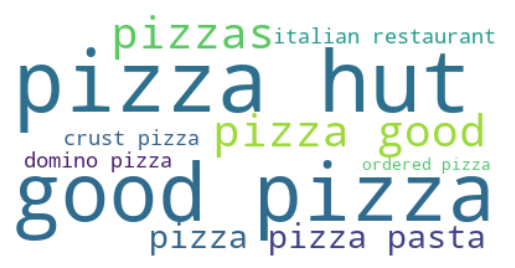

In [48]:
# Show word cloud
create_wordcloud(model, topic=0)

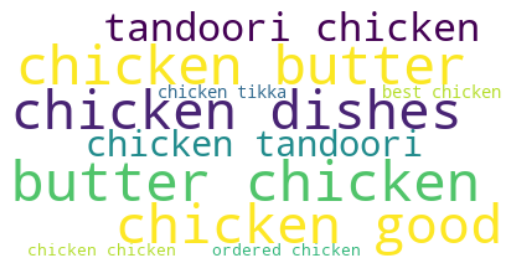

In [49]:
# Show word cloud
create_wordcloud(model, topic=1)

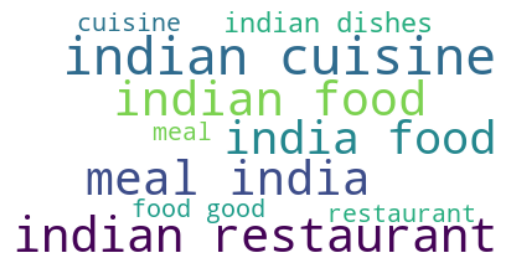

In [50]:
# Show word cloud
create_wordcloud(model, topic=2)

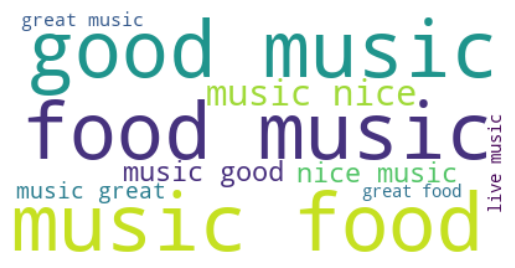

In [51]:
# Show word cloud
create_wordcloud(model, topic=3)

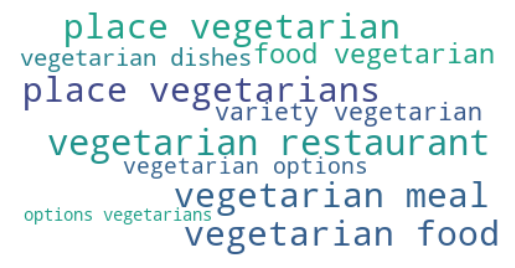

In [52]:
# Show word cloud
create_wordcloud(model, topic=4)

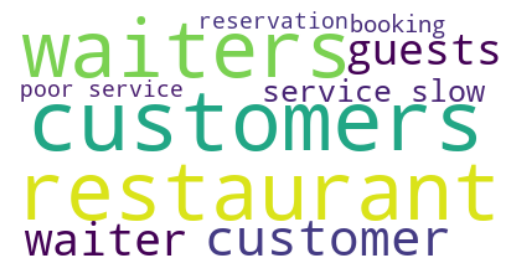

In [53]:
# Show word cloud
create_wordcloud(model, topic=5)

## Saving results after running topic modeling with all data

In [54]:
topics_info = model.get_topic_info()
documents_info = model.get_document_info(documents)

documents_info.to_csv('documents_all.csv', sep='\t', index=True)
topics_info.to_csv('topics_all.csv', sep='\t', index=True)

In [55]:
# getting word distribution per topic
topics = model.get_topics()
words_per_topic = {}
for topic_id in topics.keys():
    words = []
    for item in topics[topic_id]:
        words.append(item[0])
    words_per_topic[topic_id] = words
    
# getting topic contribution per document
contribution = probabilities
# corpus
corpus = documents
# document ids
doc_ids_list = range(len(corpus))


import numpy as np

docs_info = model.get_document_info(documents)

# create dataframes to hold the solutions
# ignoring topic -1
topic_csv_df = pd.DataFrame()
doc_csv_df = pd.DataFrame()

# Get main topic in each document
for i, row in enumerate(contribution):
    max_score = np.max(row)
    topic_num = np.argmax(row)

    try:
        ind = np.argpartition(row, -5)[-5:]
        top5 = ind[np.argsort(row[ind])]
        top5 = np.flip(top5)
    except:
        ind = np.argpartition(row, -1)[-1:]
        top5 = ind[np.argsort(row[ind])]
        top5 = np.flip(top5)

    doc_csv_df = doc_csv_df.append(pd.Series([int(topic_num), round(max_score, 4), top5]), ignore_index=True)
doc_csv_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Top5_Topics']

# adding document id and numero unificado
juris_ids = pd.Series(doc_ids_list)
doc_csv_df = pd.concat([juris_ids, doc_csv_df], axis=1)

# Add original text to the end of the output
contents = pd.Series(corpus)
doc_csv_df = pd.concat([doc_csv_df, contents], axis=1)

# Format
doc_csv_df.columns = ['Document_id', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Top5_Topics', 'Text']

for topic_num in range(0, len(words_per_topic)-1):
    wp = words_per_topic[topic_num]
    topic_keywords = ", ".join([word for word in wp])
    topic_csv_df = topic_csv_df.append(pd.Series([topic_num, topic_keywords]), ignore_index=True)
topic_csv_df.columns = ['Topic', 'Keywords']

print(doc_csv_df.shape)
print(topic_csv_df.shape)

doc_csv_df.to_csv('pp_solution_documents_all.csv', sep='\t', index=False)
topic_csv_df.to_csv('pp_solution_opics_all.csv', sep='\t', index=False)

(147579, 5)
(351, 2)


## Ratings distribution per topic 

In [56]:
doc_csv_df.columns

Index(['Document_id', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Top5_Topics',
       'Text'],
      dtype='object')

In [57]:
# using the index as id. This will help to identify the documents after topic modeling
df['id'] = df.index
df

,rating_review,review_full,pp_text,id
0,5,"Totally in love with the Auro of the place, re...",totally love auro place really beautiful quite...,0
1,5,I went this bar 8 days regularly with my husba...,went bar days regularly husband fully satisfie...,1
2,5,We were few friends and was a birthday celebra...,friends birthday celebration food good taste r...,2
3,5,Fatjar Cafe and Market is the perfect place fo...,fatjar cafe market perfect place casual lunch ...,3
4,5,"Hey Guys, if you are craving for pizza and sea...",hey guys craving pizza searching visit cafe ye...,4
...,...,...,...,...
147576,5,Near by airport very calm and cool environment...,near airport calm cool environment nice staff ...,147576
147577,5,My favourite place to stay. Great service. Ash...,favourite place stay great service ashish bhar...,147577
147578,5,"good food with nice decoration, drinks list al...",good food nice decoration drinks list alot cho...,147578
147579,4,Near to airport .it is fine property. Staff i...,near airport fine property staff warm friendly...,147579


In [58]:
docs_per_topic = model.get_document_info(documents)

# the index correspond to the id (order) of the document in the original dataframe. We can use 
# it to identify the document and restore the ratings
docs_per_topic['id'] = docs_per_topic.index
docs_per_topic

,Document,Topic,Name,Representation,Aspect1,Representative_Docs,Top_n_words,Probability,Representative_document,id
0,totally love auro place really beautiful quite...,-1,-1_restaurants_restaurant_buffet_meal,"[restaurants, restaurant, buffet, meal, lunch,...","[restaurants, buffet, delhi, dinner, chicken, ...",[worst indian restaurant goes dhaba one worst ...,restaurants - restaurant - buffet - meal - lun...,0.609092,False,0
1,went bar days regularly husband fully satisfie...,19,19_great service_excellent service_amazing ser...,"[great service, excellent service, amazing ser...","[good service, hospitality, service mr, servic...",[indeed pleasant enjoyable relaxing atmosphere...,great service - excellent service - amazing se...,0.008328,False,1
2,friends birthday celebration food good taste r...,12,12_birthday celebration_birthday party_celebra...,"[birthday celebration, birthday party, celebra...","[birthday celebration, anniversary dinner, wif...",[several time never fails deliver great place ...,birthday celebration - birthday party - celebr...,0.185043,False,2
3,fatjar cafe market perfect place casual lunch ...,-1,-1_restaurants_restaurant_buffet_meal,"[restaurants, restaurant, buffet, meal, lunch,...","[restaurants, buffet, delhi, dinner, chicken, ...",[worst indian restaurant goes dhaba one worst ...,restaurants - restaurant - buffet - meal - lun...,0.937262,False,3
4,hey guys craving pizza searching visit cafe ye...,-1,-1_restaurants_restaurant_buffet_meal,"[restaurants, restaurant, buffet, meal, lunch,...","[restaurants, buffet, delhi, dinner, chicken, ...",[worst indian restaurant goes dhaba one worst ...,restaurants - restaurant - buffet - meal - lun...,0.657922,False,4
...,...,...,...,...,...,...,...,...,...,...
147574,near airport calm cool environment nice staff ...,-1,-1_restaurants_restaurant_buffet_meal,"[restaurants, restaurant, buffet, meal, lunch,...","[restaurants, buffet, delhi, dinner, chicken, ...",[worst indian restaurant goes dhaba one worst ...,restaurants - restaurant - buffet - meal - lun...,0.128644,False,147574
147575,favourite place stay great service ashish bhar...,-1,-1_restaurants_restaurant_buffet_meal,"[restaurants, restaurant, buffet, meal, lunch,...","[restaurants, buffet, delhi, dinner, chicken, ...",[worst indian restaurant goes dhaba one worst ...,restaurants - restaurant - buffet - meal - lun...,0.162641,False,147575
147576,good food nice decoration drinks list alot cho...,-1,-1_restaurants_restaurant_buffet_meal,"[restaurants, restaurant, buffet, meal, lunch,...","[restaurants, buffet, delhi, dinner, chicken, ...",[worst indian restaurant goes dhaba one worst ...,restaurants - restaurant - buffet - meal - lun...,0.010842,False,147576
147577,near airport fine property staff warm friendly...,-1,-1_restaurants_restaurant_buffet_meal,"[restaurants, restaurant, buffet, meal, lunch,...","[restaurants, buffet, delhi, dinner, chicken, ...",[worst indian restaurant goes dhaba one worst ...,restaurants - restaurant - buffet - meal - lun...,0.273919,False,147577


In [59]:
list_of_ids = docs_per_topic[docs_per_topic['Topic'] == 0]['id'].to_list()
print(len(list_of_ids))
df_topic_0 = df[df['id'].isin(list_of_ids)]
df_topic_0

4942


,rating_review,review_full,pp_text,id
25,5,Fat Jar is one of the most hygienic and beauti...,fat jar one hygienic beautiful places delhi nc...,25
104,4,Food is great. I love the shakes. It is one of...,food great love shakes one favourite restauran...,104
408,4,"Food you get here will be of Italian kitchen, ...",food get italian kitchen ordered grilled aspar...,408
460,5,"Had a delicious lunch with my partner, menu wa...",delicious lunch partner menu delicious dishes ...,460
484,3,Nice clean restaurant with fresh decor. Tacos ...,nice clean restaurant fresh decor tacos ok fis...,484
...,...,...,...,...
145037,5,"Awesome bhalla papdi , must try. Staff is good...",awesome bhalla papdi must try staff good ambie...,145037
145141,5,The food preparation was just awesome... every...,food preparation awesome everything freshly ma...,145141
145260,5,Good setting and helpful staff. Food selection...,good setting helpful staff food selection good...,145260
145702,5,Met Vivek Singh at Thyme. What an excellent cu...,met vivek singh thyme excellent customer servi...,145702


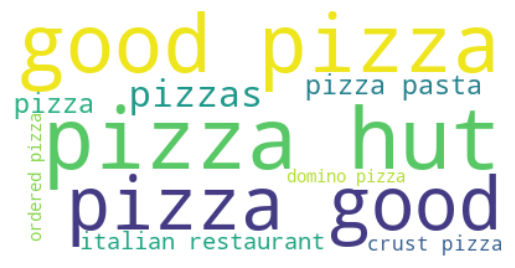

<AxesSubplot:ylabel='rating_review'>

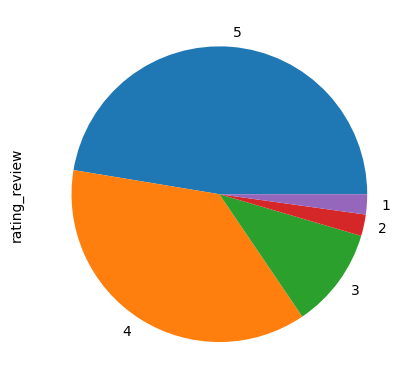

In [60]:
%matplotlib inline

create_wordcloud(model, topic=0)

df_topic_0['rating_review'].value_counts().plot(kind='pie')

In [61]:
list_of_ids = docs_per_topic[docs_per_topic['Topic'] == 1]['id'].to_list()
print(len(list_of_ids))
df_topic_1 = df[df['id'].isin(list_of_ids)]
df_topic_1

3854


,rating_review,review_full,pp_text,id
157,5,The place has class to it. We were here for ev...,place class evening drinks early dinner loved ...,157
280,5,NYC serves some pretty nice dishes the peshawa...,nyc serves pretty nice dishes peshawari murg t...,280
287,5,Eated chicken bow in the NYC. Great service by...,eated chicken bow nyc great service staff mr a...,287
379,3,"Friendly and helpful staff, good atmosphere, b...",friendly helpful staff good atmosphere food la...,379
426,4,We had dinner here after a long very hot day. ...,dinner long hot day food excellent chicken pep...,426
...,...,...,...,...
147162,5,Great dinning experience in a modern version o...,great dinning experience modern version classi...,147162
147366,5,Thank you! Amit my server gave excellent servi...,thank amit server gave excellent service break...,147366
147401,5,"Visited Dilli 32 , enjoyed the food .service b...",visited dilli 32 enjoyed food service krishna ...,147401
147421,5,Had a great time. Awesome ambience and really ...,great time awesome ambience really delightful ...,147421


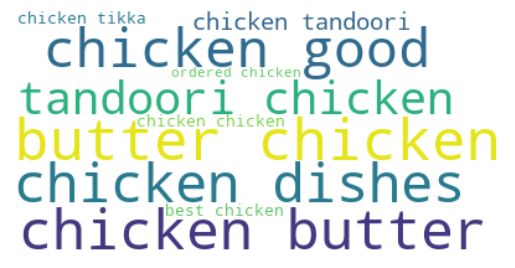

<AxesSubplot:ylabel='rating_review'>

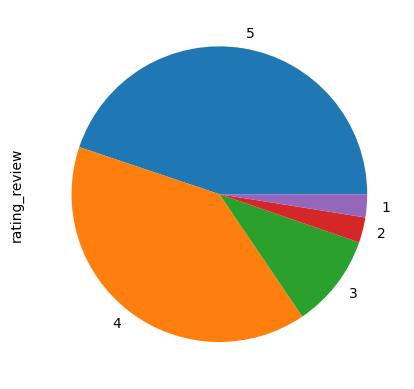

In [62]:
create_wordcloud(model, topic=1)

df_topic_1['rating_review'].value_counts().plot(kind='pie')

In [63]:
list_of_ids = docs_per_topic[docs_per_topic['Topic'] == 2]['id'].to_list()
print(len(list_of_ids))
df_topic_2 = df[df['id'].isin(list_of_ids)]
df_topic_2

3685


,rating_review,review_full,pp_text,id
7,5,If you are looking for a varied selection of d...,looking varied selection delicious high qualit...,7
159,4,"Charming place, indo-european fusion style, pe...",charming place indo european fusion style perf...,159
178,5,During my vacations to India we hardly go out ...,vacations india hardly go eat recommendation f...,178
299,5,"While staying at Holiday Inn, we dined at Kyli...",staying holiday inn dined kylin total guests f...,299
307,4,Food and service were both excellent. The men...,food service excellent menu quite varied tasty...,307
...,...,...,...,...
147201,5,The food and service was fantastic. The warm a...,food service fantastic warm ambience friendly ...,147201
147231,4,Excellent breakfast and the service was great...,excellent breakfast service great especially m...,147231
147279,5,Kanchan is amazing She was so awesome and took...,kanchan amazing awesome took time tell wife st...,147279
147332,5,Very good hangout place or for business meetin...,good hangout place business meetings small gat...,147332


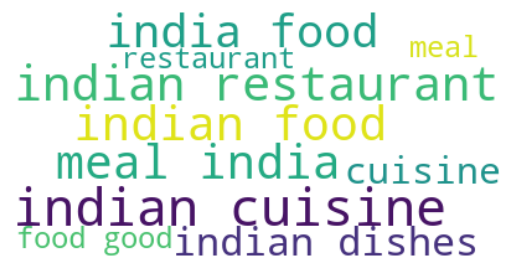

<AxesSubplot:ylabel='rating_review'>

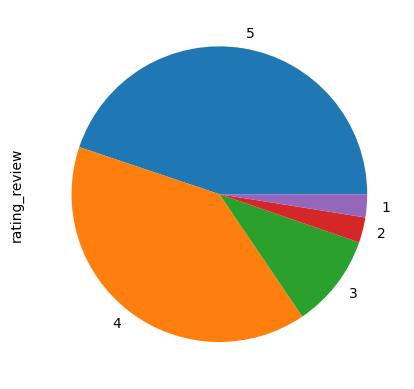

In [64]:
create_wordcloud(model, topic=2)

df_topic_1['rating_review'].value_counts().plot(kind='pie')

In [65]:
list_of_ids = docs_per_topic[docs_per_topic['Topic'] == 13]['id'].to_list()
print(len(list_of_ids))
df_topic_13 = df[df['id'].isin(list_of_ids)]
df_topic_13

1447


,rating_review,review_full,pp_text,id
627,4,Wanted to try many things but for a constraint...,wanted try many things constraint time could t...,627
689,3,"We had a simple lunch, nothing fancy, just mok...",simple lunch nothing fancy moktails tacos burg...,689
2675,4,We stayed in the hotel and visited this bar a ...,stayed hotel visited bar couple times nice spa...,2675
2689,4,Love the club sandwich and their bloody mary c...,love club sandwich bloody mary cocktail kinda ...,2689
2750,5,Nyc club Sandwich is very very good! Rohit was...,nyc club sandwich good rohit great waiter know...,2750
...,...,...,...,...
143899,5,A great place to order good and healthy food f...,great place order good healthy food prepared w...,143899
143901,5,I ordered an avocado chicken egg grilled sandw...,ordered avocado chicken egg grilled sandwich s...,143901
143908,5,Ordered food from here yesterday and must say ...,ordered food yesterday must say serve tasty ye...,143908
144098,5,I had breakfast here that was really nice. sta...,breakfast really nice staffs like shivam patha...,144098


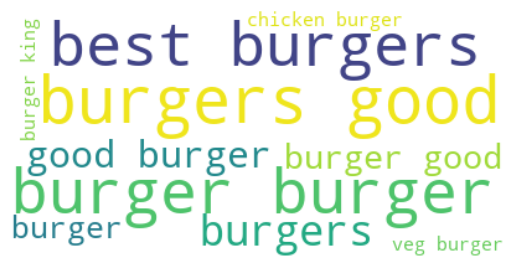

<AxesSubplot:ylabel='rating_review'>

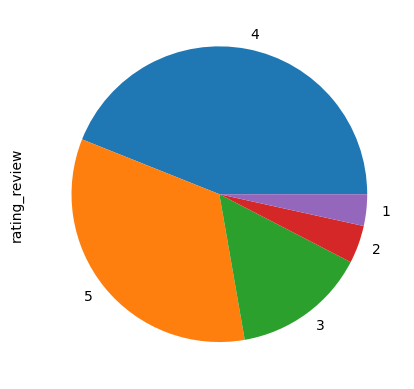

In [66]:
create_wordcloud(model, topic=13)

df_topic_13['rating_review'].value_counts().plot(kind='pie')

In [67]:
list_of_ids = docs_per_topic[docs_per_topic['Topic'] == 211]['id'].to_list()
print(len(list_of_ids))
df_topic_211 = df[df['id'].isin(list_of_ids)]
df_topic_211

22


,rating_review,review_full,pp_text,id
19250,5,Our first time at the Bukhara and definitely n...,first time bukhara definitely last food incred...,19250
31966,5,Fantastic food and very good service you just ...,fantastic food good service dream thing help a...,31966
33478,5,"Amazing food, Awesome Ambience n great service...",amazing food awesome ambience great service re...,33478
76386,4,"What a night it was ! The food is awesome , am...",night food awesome amazing ambience great serv...,76386
101537,5,We went here twice during our trip to Delhi - ...,went twice trip delhi food great service excel...,101537
102402,5,"Once you visit this place , you really relish ...",visit place really relish true life original d...,102402
106192,5,"English , Chinese, Indian, American Continenta...",english chinese indian american continental st...,106192
106255,5,Excellent food in tamra. We are not from delhi...,excellent food tamra delhi came first time won...,106255
107093,5,"Oresome, feeling special, the service provided...",oresome feeling special service provided excel...,107093
111945,5,This is worth a visit with cool ambiance and g...,worth visit cool ambiance good food excellent ...,111945


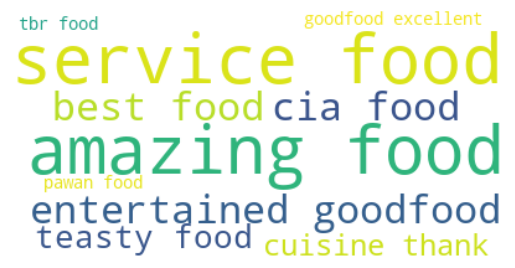

<AxesSubplot:ylabel='rating_review'>

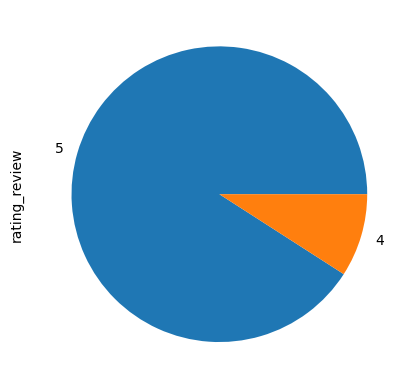

In [69]:
create_wordcloud(model, topic=211)

df_topic_211['rating_review'].value_counts().plot(kind='pie')

In [71]:
list_of_ids = docs_per_topic[docs_per_topic['Topic'] == 214]['id'].to_list()
print(len(list_of_ids))
df_topic_214 = df[df['id'].isin(list_of_ids)]
df_topic_214

22


,rating_review,review_full,pp_text,id
8270,3,"While we normally dont eat meals at HRC, we di...",normally dont eat meals hrc time food consiste...,8270
14886,5,Food is outstanding. Service is professional a...,food outstanding service professional ambience...,14886
20992,1,Drinks and food seem cheap. They even have a 2...,drinks food seem cheap even happy hour also st...,20992
22121,4,they have variety of dishes and vairety of dri...,variety dishes vairety drinks place expensive ...,22121
27519,4,"Can't fault the food, reasonable portion, serv...",fault food reasonable portion service good env...,27519
27912,5,Visited here on the 12th Nov 2016. Nice surpri...,visited 12th nov 2016 nice surprise old worldl...,27912
35709,4,Tonight we had dinner for two adults plus one ...,tonight dinner two adults plus one child came ...,35709
44176,2,"Great place for a drink and cocktails, but add...",great place drink cocktails add top bill 35 ta...,44176
45269,2,"Had lunch here December 21, 2016. The Butter C...",lunch december 21 2016 butter chicken average ...,45269
49981,2,We ate here in November 2016. The cost of food...,ate november 2016 cost food drink really expen...,49981


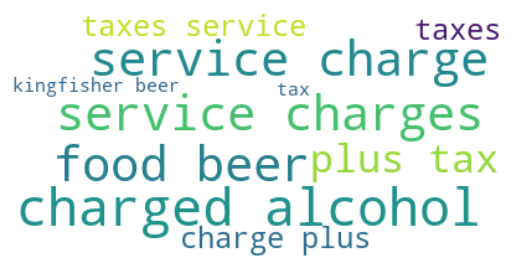

<AxesSubplot:ylabel='rating_review'>

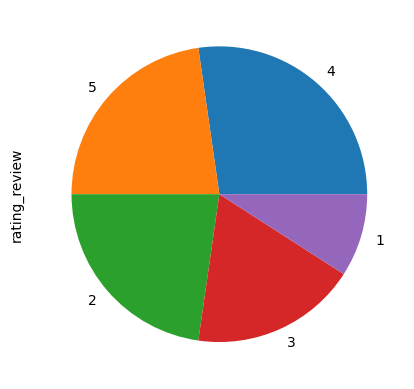

In [72]:
create_wordcloud(model, topic=214)

df_topic_214['rating_review'].value_counts().plot(kind='pie')

In [73]:
print(df_topic_214[df_topic_214['rating_review'] == 5]['review_full'].values[0])

Food is outstanding. Service is professional and the ambience is memorable. Candle light as nothing on this restaurant with all the lighting supplied in this way. Romantic - a big yes. But don't think that this all there is. The big plus is the food which was outstanding and in western terms not at all pricey. Just be prepared for the 20% tax on alcohol and 10% on food above and beyond the listed prices.


In [74]:
print(df_topic_214[df_topic_214['rating_review'] == 4]['review_full'].values[0])

they have variety of dishes and vairety of drinks but the place is very expensive. The hard thing is  they have mandatory service charges. it is against the law.


In [75]:
print(df_topic_214[df_topic_214['rating_review'] == 3]['review_full'].values[0])

While we normally dont eat meals at HRC, we did this time, the food was consistent with others. Wasnt impressed with the limited beer selection and the amount of taxes added to the bill was ridiculous.


In [76]:
print(df_topic_214[df_topic_214['rating_review'] == 2]['review_full'].values[0])

Great place for a drink and cocktails, but add on top of your bill 35.8% of taxes, service charge and service tax.


In [77]:
print(df_topic_214[df_topic_214['rating_review'] == 1]['review_full'].values[0])

Drinks and food seem cheap. They even have a 2 for 1 happy hour, they also state no service charge on the menu but still add 20% vat onto drinks and 5% to food. I had left a really good review bit deleted it to leave this revised view once the bill arrived. Dodgy tactics lost you a good review pebble st


In [78]:
list_of_ids = docs_per_topic[docs_per_topic['Topic'] == 198]['id'].to_list()
print(len(list_of_ids))
df_topic_198 = df[df['id'].isin(list_of_ids)]
df_topic_198

25


,rating_review,review_full,pp_text,id
25104,4,I ate at this restaurant based on the recommen...,ate restaurant based recommendation guide chic...,25104
34066,4,Went here on the last night of a group tour - ...,went last night group tour great atmosphere go...,34066
42200,1,Omg the worst experience! I actually walked ou...,omg worst experience actually walked without p...,42200
46164,1,"Simply idiotic! The food is pathetic, the plac...",simply idiotic food pathetic place cramped ful...,46164
46944,1,Believe me I was terrified- TERRIFIED to find ...,believe terrified terrified find cockroach wat...,46944
51097,1,It was below average for all the food which I ...,average food delhi trip saw small cockroach ta...,51097
51941,1,"The restaurant was lit properly, Good Sitting,...",restaurant lit properly good sitting good serv...,51941
54961,3,This place serves some great food...has a nice...,place serves great food nice ambience though s...,54961
55009,1,"It was monsoon, so this hotel being an average...",monsoon hotel average star welcomed guest satu...,55009
56395,2,Have eaten at this place multiple times as thi...,eaten place multiple times close office stoppe...,56395


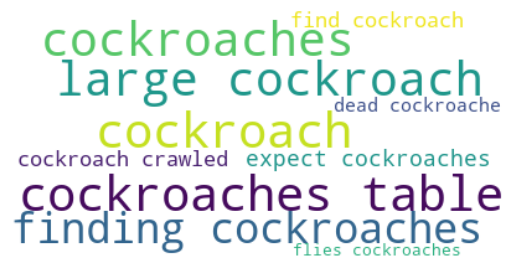

<AxesSubplot:ylabel='rating_review'>

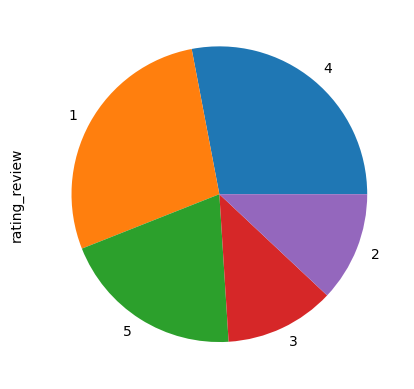

In [79]:
create_wordcloud(model, topic=198)

df_topic_198['rating_review'].value_counts().plot(kind='pie')

In [80]:
print(df_topic_198[df_topic_198['rating_review'] == 5]['review_full'].values[0])

Good food but expensive ! avoid if you do not wont to spend lot there are lots of options near by like tadka ,madan and khosla cafe ..


In [82]:
print(df_topic_198[df_topic_198['rating_review'] == 4]['review_full'].values[0])

I ate at this restaurant based on the recommendation of my guide. I had the Chicken Biryani and butter nan, and my food was delicious. The prices were reasonable, and the service was good. Regarding cleanliness, it's India, so be prepared. I found the restaurant area to be clean, but when I went to the bathroom, I saw a baby cockroach! Overall, I enjoyed my lunch.


In [83]:
print(df_topic_198[df_topic_198['rating_review'] == 3]['review_full'].values[0])

This place serves some great food...has a nice ambience though the service is usually slow! Their buffet isn't that great have tried it once when we found a baby cockroach in the food! So I don't know how they go about storing and keeping their food for the buffet! It is not expected out of a five star Restraunt!


In [84]:
print(df_topic_198[df_topic_198['rating_review'] == 2]['review_full'].values[0])

Have eaten at this place multiple times as this is close to my husband’s office but stopped doing so after I noticed these things: • Unhygienic: Literally saw cockroaches taking a tour around the table and on the walls adjacent to it. • Had to close my eyes and nose if I ever had to use their washroom which is on the second floor right next to their kitchen.  • Inattentive servers  If you can ignore all the above things, the food is good.


In [85]:
print(df_topic_198[df_topic_198['rating_review'] == 1]['review_full'].values[0])

Omg the worst experience! I actually walked out without paying for our starters and drinks! There were cockroaches everywhere around us. It was such an unhygienic restaurant!  Awful! Awful! Not even worth one star!


In [86]:
list_of_ids = docs_per_topic[docs_per_topic['Topic'] == 277]['id'].to_list()
print(len(list_of_ids))
df_topic_277 = df[df['id'].isin(list_of_ids)]
df_topic_277

13


,rating_review,review_full,pp_text,id
21751,3,unno what's the Mayhem all about. Every time y...,unno mayhem every time go least 45 min waiting...,21751
50599,1,Had an embarrassing visit to this place. Took ...,embarrassing visit place took guests lunch lef...,50599
59473,1,We went to flyp after making reservation. They...,went flyp making reservation gave us table out...,59473
61740,3,We went to hotmess and were in very happy mood...,went hotmess happy mood mood changed quickly q...,61740
65306,2,we went there after reading lots of reviews an...,went reading lots reviews promotions social ne...,65306
72160,1,I had given a birthday party to Imperfecto Cyb...,given birthday party imperfecto cyber hub gurg...,72160
74599,2,Very bad place with bad staff. Tried to order ...,bad place bad staff tried order beer pitcher c...,74599
79412,3,I visited this place on a Sunday night and eve...,visited place sunday night even sunday late ev...,79412
86890,4,imperfecto is may be the biggest pub in delhi ...,imperfecto may biggest pub delhi ncr mon man p...,86890
88936,5,Who doesn't like Sweedish after a good dinner....,like sweedish good dinner dine saket went smal...,88936


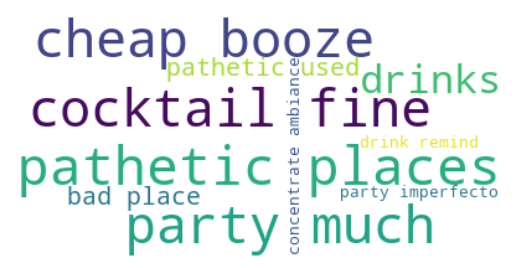

<AxesSubplot:ylabel='rating_review'>

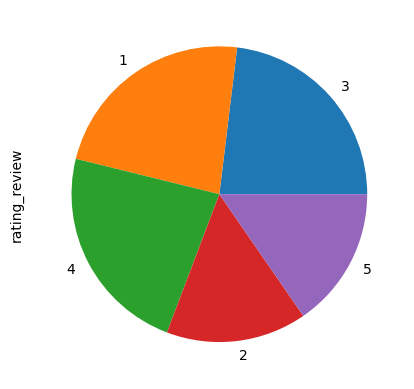

In [87]:
create_wordcloud(model, topic=277)

df_topic_277['rating_review'].value_counts().plot(kind='pie')

In [88]:
print(df_topic_277[df_topic_277['rating_review'] == 5]['review_full'].values[0])

Who doesn't like Sweedish after a good dinner....We had dine out in saket only and went to this v small outlet called WAFFLICIOUS. ... It has a v cute garden area outside with lightning on a tree... Ordered : sinful nutella , strawberry nutella and fruit blast , all waffles were so amazing and yummlicious...Waffles were so so soft ... The best tried was SINFUL NUTELLA..... It's a must try outlet... Thanks for serving....


In [89]:
print(df_topic_277[df_topic_277['rating_review'] == 1]['review_full'].values[0])

Had an embarrassing visit to this place. Took guests on Lunch and was left completely disappointed.  Beer option was limited, only two kinds available. One guest ordered a custom made cocktail that the bartender could not comprehend. It was a simple gin in lime water. Was finally served lime water separately and gin separately. Absolutely no creativity. Then ordered three Pizza's and a pasta. What we got was two pizza's and an excuse that they forgot to make the third one. After waiting for 15 minutes, were served the wrong Pizza. When highlighted, there was no sorry, just more wait. Had to wait another 15 minutes to finally get the Pizza. It was surely awkward for my guest to have his meal when everyone else were done. In a hurry, he just ate couple of slices and finished.  Overall, the whole episode left a bad taste. This place surely needs to train their staff in a better way and focus more on customer satisfaction.  Would not recommend this place for a formal lunch/dinner occasion.